# RESULT 

In this noteook you can see the results of our Genetic Algorithm.

# Load Libraries

(4509, 5605)


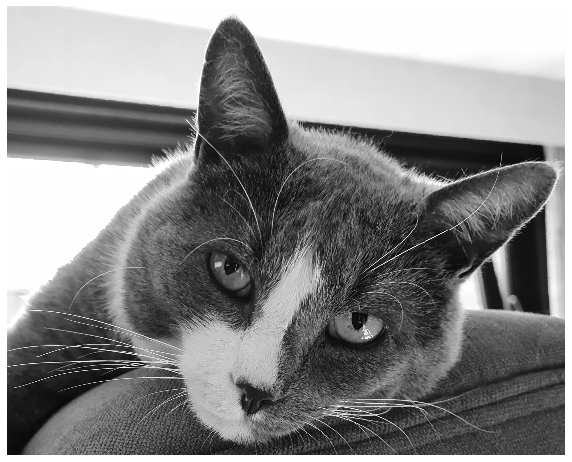

In [1]:
from IPython.display import display, Markdown, Latex

%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os

def show_image(image):
    # plot the image
    fig = plt.figure(figsize=(10,10))
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    return plt.show()


#-----------------------#
# load the target image #
#-----------------------#
image = cv2.imread('cat_3.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# resize
print(image.shape)
image = cv2.resize(image, (560, 450))

# plot the image
show_image(image)

# Show Image

# Iteration: 0

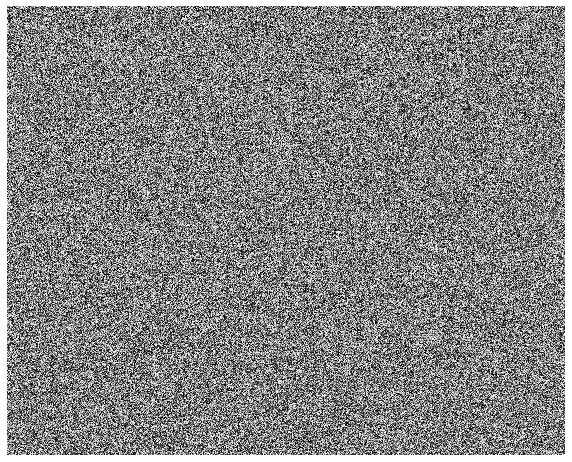

# Iteration: 71000

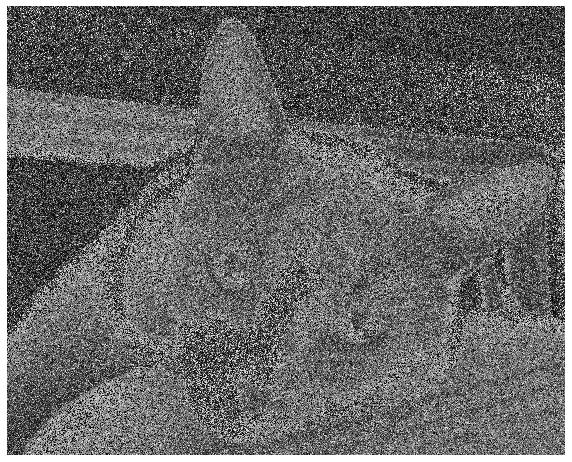

# Iteration: 142000

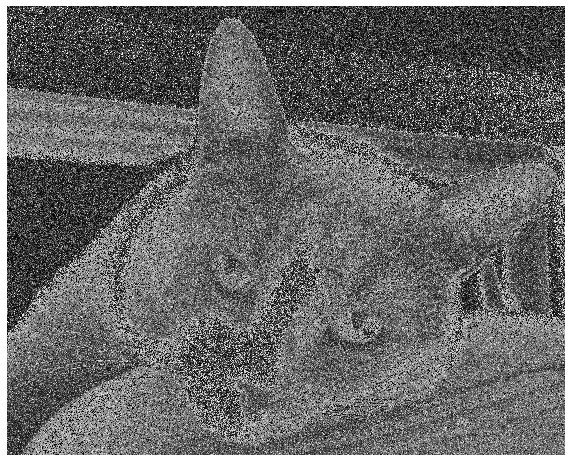

# Iteration: 213000

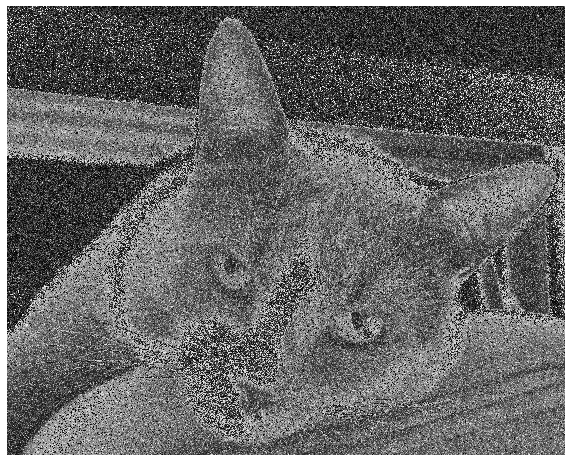

# Iteration: 284000

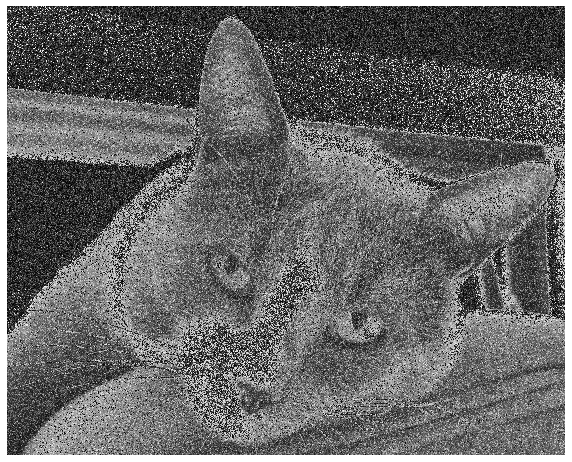

# Iteration: 355000

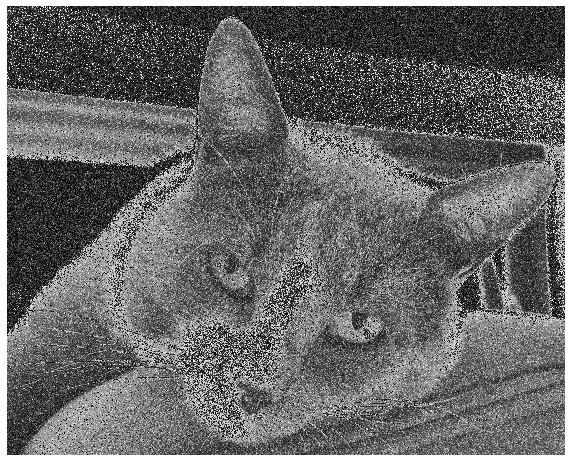

# Iteration: 426000

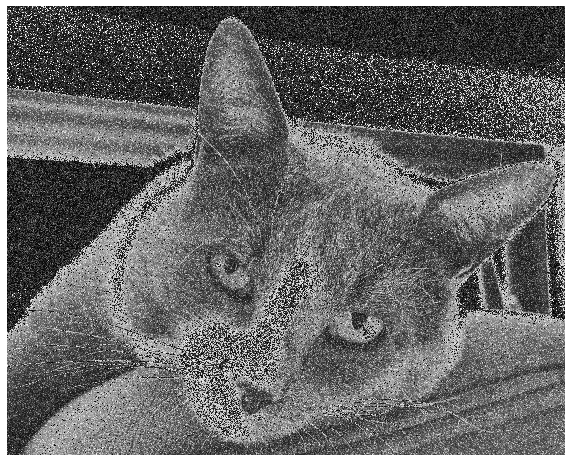

# Iteration: 497000

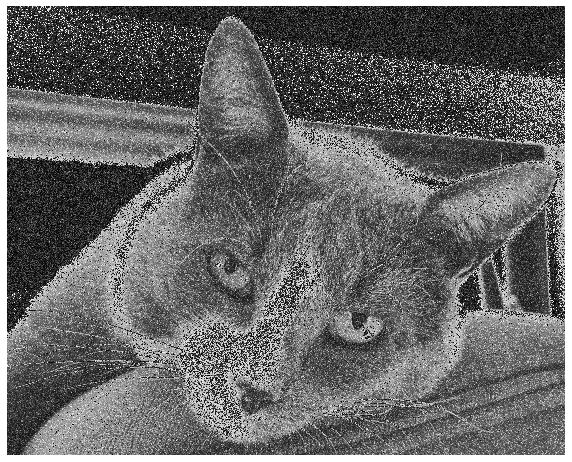

# Iteration: 568000

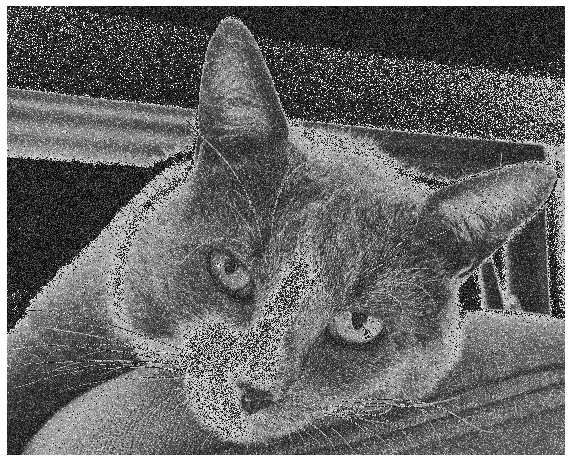

# Iteration: 639000

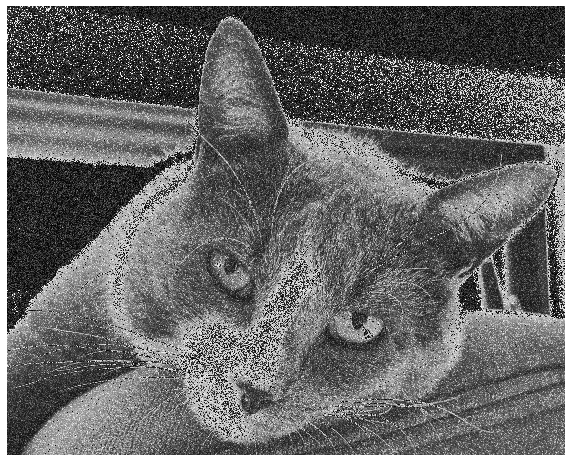

# Iteration: 710000

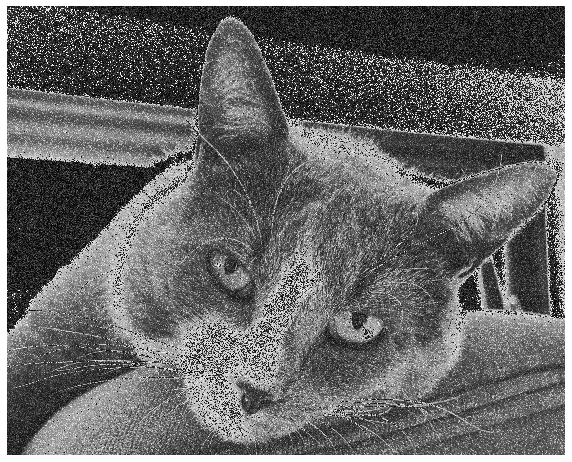

# Original

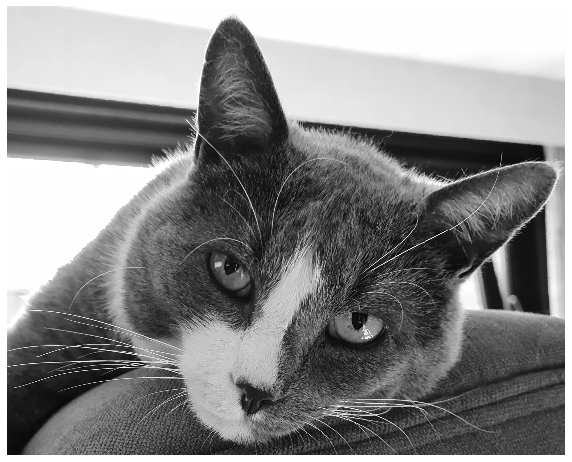

In [2]:
# Load logs
logs = pickle.load( open( "logs_1.p", "rb" ) ) if os.path.isfile('logs_1.p') else {}
logs.update(pickle.load( open( "logs.p", "rb" ) ) )

# print some logs
for img in [0] + [x[-1] for x in np.array_split(list(logs.keys()), 10)]:
    display(Markdown(f'# Iteration: {img}'))
    show_image(logs[img])
    
# show result
display(Markdown(f'# Original'))
show_image(image)

# Create a video

In [46]:
import numpy as np
import cv2

# initialize water image
height = image.shape[0]
width = image.shape[1]

# load the data
logs = pickle.load( open( "logs_1.p", "rb" ) ) if os.path.isfile('logs_1.p') else {}
logs.update(pickle.load( open( "logs.p", "rb" ) ) )
    
# initialize video writer
fourcc = cv2.VideoWriter_fourcc('M','J','P','G')
fps = 32
video_filename = 'output.avi'
out = cv2.VideoWriter(video_filename, fourcc, fps, (1920, 1080))

# add the frames
frame = np.zeros((1080, 1920), dtype='uint8')
for img in [0] + [x[-1] for x in np.array_split(list(logs.keys()), 32*30)]:
    #add this array to the video
    frame[frame.shape[0]//2 - height//2 : frame.shape[0]//2 + height//2,  frame.shape[1]//2 - width//2 : frame.shape[1]//2 + width//2] = logs[img]
    
    out.write( cv2.merge([frame, frame, frame]) )

# close out the video writer
out.release()

In [43]:
import numpy as np
import cv2

# initialize water image
height = image.shape[0]
width = image.shape[1]

# load the data
logs = pickle.load( open( "logs_1.p", "rb" ) ) if os.path.isfile('logs_1.p') else {}
logs.update(pickle.load( open( "logs.p", "rb" ) ) )
    
# initialize video writer
fourcc = cv2.VideoWriter_fourcc('M','J','P','G')
fps = 32
video_filename = 'output.avi'
out = cv2.VideoWriter(video_filename, fourcc, fps, (width, height))

# new frame after each addition of water
frame = np.zeros((920, 800), dtype='uint8')
for img in [0] + [x[-1] for x in np.array_split(list(logs.keys()), 32*30)]:
    #add this array to the video
    #frame[frame.shape[0]//2 - height//2 : frame.shape[0]//2 + height//2,  frame.shape[1]//2 - width//2 : frame.shape[1]//2 + width//2] = logs[img]
    #gray = cv2.normalize(frame, None, 255, 0, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    gray_3c = cv2.merge([frame, frame, frame])
    out.write(gray_3c)

# close out the video writer
out.release()